### Analysing The 3 Horse Race

#### Hi, It's 25 days to the Nigerian general elections. I thought it will be a good idea to get a feel of what the electorates are feeling like, the electorates on twitter at least. I am going to be exploring tweets around the 3 leading presidential candidates, trying to analyse their level of social media acceptance and popular sentiment about them. Let's goo!

In [1]:
#Importing the Needed libraries
import snscrape.modules.twitter as sntwitter
import pandas as pd

##### I'll use Snscrape to scrape tweets about each of them into 3 different dataframes. 
##### I'l scrape tweets from the last week in January 2023, between the 24th and 31st.

In [2]:
def scrape_tweets(text:str):
    # Create a list to append all tweet attributes.
    attributes_container = []


    # Using TwitterSearchScraper to scrape data and append tweets to list
    for i,tweet in enumerate(sntwitter.TwitterSearchScraper(f'{text} since:2023-01-24 until:2023-01-31').get_items()):
         attributes_container.append([tweet.date, tweet.rawContent, tweet.likeCount, tweet.replyCount, tweet.quoteCount])
    
    # Creating a dataframe from the tweets list above 
    df = pd.DataFrame(attributes_container, columns=["Date Created", "Tweet", "Likes", "Replies",'Quotes'])
    return df

In [33]:
atiku_df=scrape_tweets('atiku')

In [52]:
atiku_df
#atiku_df.to_csv('atiku_tweets.csv')

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
0,2023-01-30,23:59,@YeleSowore @atiku @OfficialPDPNig @officialAB...,0,0,0,0.000000
1,2023-01-30,23:59,"@BwalaDaniel Atiku, Senate president! This man...",2,4,0,2.000000
2,2023-01-30,23:59,@SegunAsala @YeleSowore @atiku @OfficialPDPNig...,1,0,0,0.000000
3,2023-01-30,23:59,DJ play me as e dey sweet us e go dey pain dem...,0,0,0,0.000000
4,2023-01-30,23:59,@Qdpaper2 He said he made atiku senate president,0,1,0,0.000000
...,...,...,...,...,...,...,...
83983,2023-01-24,00:01,@AhmedAdamu @atiku I will vote for him,3,0,0,0.000000
83984,2023-01-24,00:01,@atiku My people for Niger-Delta go collect yo...,11,1,0,0.090909
83985,2023-01-24,00:01,@atiku My Allah help you,1,0,0,0.000000
83986,2023-01-24,00:00,"@atiku Greedy Atiku, don't waste stolen resour...",0,0,0,0.000000


In [36]:
obi_df=scrape_tweets('Peter Obi')

In [9]:
obi_df
#obi_df.to_csv('obi_tweets.csv')

,Date Created,Tweet,Likes,Replies,Quotes
0,2023-01-30 23:59:55+00:00,@YeleSowore @atiku @OfficialPDPNig @officialAB...,0,0,0
1,2023-01-30 23:59:47+00:00,@SegunAsala @YeleSowore @atiku @OfficialPDPNig...,1,0,0
2,2023-01-30 23:59:39+00:00,@PeterObi Hey Mr! Thank you for all you've don...,4,0,0
3,2023-01-30 23:59:33+00:00,@simon_ekpa Tinubu ur presidential candidate ...,1,0,0
4,2023-01-30 23:59:29+00:00,We can actually win this election without prop...,0,0,0
...,...,...,...,...,...
148473,2023-01-24 00:01:24+00:00,@abayi_art @PeterObi Chai make Obi win make I ...,13,0,0
148474,2023-01-24 00:01:02+00:00,E don reach make we dey gbe won sepe abi? Any ...,3,0,0
148475,2023-01-24 00:00:51+00:00,@repairurideanow @YeleSowore @PeterObi its pol...,1,0,0
148476,2023-01-24 00:00:45+00:00,Watch what a SAN —Supposed legal professional ...,2,0,0


In [43]:
tinubu_df=scrape_tweets('Tinubu')

In [12]:
tinubu_df
#tinubu_df.to_csv('Tinubu_tweets.csv')

,Date Created,Tweet,Likes,Replies,Quotes
0,2023-01-30 23:59:55+00:00,@YeleSowore @atiku @OfficialPDPNig @officialAB...,0,0,0
1,2023-01-30 23:59:53+00:00,"@BwalaDaniel Atiku, Senate president! This man...",2,4,0
2,2023-01-30 23:59:52+00:00,"@OfficialAPCNg how market nau, abi una still w...",2,0,0
3,2023-01-30 23:59:47+00:00,@SegunAsala @YeleSowore @atiku @OfficialPDPNig...,1,0,0
4,2023-01-30 23:59:33+00:00,@simon_ekpa Tinubu ur presidential candidate ...,1,0,0
...,...,...,...,...,...
135901,2023-01-24 00:00:51+00:00,@lotanna_ok @Chuks_Eric_ @_weyimi @PO_GrassRoo...,0,0,0
135902,2023-01-24 00:00:26+00:00,@Mr_Mtag @KashimSM @officialABAT @TinubuMediaS...,12,0,0
135903,2023-01-24 00:00:15+00:00,"@EOdubela @Marvy_olu Vote your candidate, but ...",0,0,0
135904,2023-01-24 00:00:08+00:00,@Topboychriss Chris is it true that wike have ...,1,1,0


##### Before exploring the data or carrying out any sentimental analysis, I'll add a few new columns to the dataframe. First I'll split the 'Date Created' column into two - a date column and a time column. 
##### Then I'll create a 'Ratio' column. In twitter parlance, a tweet is ratioed if the number of quotes and replies vastly outnumbers the number of likes. This means people have reacted negatively to the post. A ratio column in our dataframe could provide us with an approximate way of evaluating popular reaction to each tweet. We'll calculate this using this formula -> (replies+quotes)/likes. Tweets that have been ratioed would thus have resulting values greater than 1.

In [51]:
def ratio(likes, replies, quotes):
    if likes == 0:
        return 0
    else:
        return(replies+quotes)/likes

def extract_date(datetime):
    return datetime[:10]

def extract_time(datetime):
    return datetime[11:16]

def add_columns(df):
    df['Date']=df['Date Created'].apply(extract_date)
    df['Time']=df['Date Created'].apply(extract_time)
    df['Ratio']=df.apply(lambda x: ratio(x.Likes,x.Replies,x.Quotes),axis=1 )
    df.drop('Date Created',axis=1,inplace=True)
    df=df[['Date','Time','Tweet','Likes','Replies','Quotes','Ratio']]
    return df

In [14]:
atiku_df=add_columns(atiku_df)
obi_df=add_columns(obi_df)
tinubu_df=add_columns(tinubu_df)

In [15]:
atiku_df.sort_values(by='Likes',ascending=False).head(10)

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
32973,2023-01-28,07:23,Atiku cannot win. Don’t waste your vote on Tin...,10100,220,44,0.026139
48954,2023-01-26,13:35,WHO WILL YOU LIKE TO WELCOME AS YOUR First Lad...,7921,78,5,0.010478
39389,2023-01-27,10:51,Tinubu - 1.8 odds \nPeter Obi - 2.4 odds \nAti...,7166,1832,216,0.285794
64042,2023-01-25,12:22,"Even if Tinubu, Atiku and kwankwaso have a mer...",6527,138,48,0.028497
41661,2023-01-27,07:05,Peter Obi suspended his campaign over the deat...,6494,264,53,0.048814
75814,2023-01-24,15:44,WHO IS THE NEXT PRESIDENT OF NIGERIA AMONG THE...,5620,50,1,0.009075
81184,2023-01-24,08:45,"I will vote for @atiku Abubakar, what about yo...",4885,2336,152,0.509314
37213,2023-01-27,15:22,If Nigeria decides to split into 3 region toda...,4836,321,72,0.081266
69070,2023-01-25,05:24,APC is teaching PDP how to play opposition rol...,4803,141,31,0.035811
67399,2023-01-25,07:55,Endorse Peter Obi or face defeat – Ozigbo to A...,4459,123,34,0.035210


In [16]:
obi_df.sort_values(by='Likes',ascending=False).head(10)

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
39000,2023-01-28,22:59,We are pleased to introduce our interactive co...,31335,1031,394,0.045476
44024,2023-01-28,19:31,"Hand in hand, we will rebuild Nigeria. -PO htt...",29458,974,245,0.041381
34575,2023-01-29,07:17,My deep appreciation to Ms. Chizzy Ebube Balog...,28824,759,190,0.032924
12481,2023-01-30,11:37,"Our spouses, Mrs Margaret Obi and Mrs Aisha Ba...",28347,795,163,0.033795
79932,2023-01-27,10:00,"This morning, I had a media chat with represen...",27721,1044,288,0.048050
91387,2023-01-26,19:42,I shared my vision and plan of turning Nigeria...,27690,946,156,0.039798
62329,2023-01-28,07:40,Nigerians remain hopeful for a national rebirt...,25238,1082,263,0.053293
45993,2023-01-28,18:42,I just arrived in Port Harcourt for the South-...,24921,1320,358,0.067333
82778,2023-01-27,08:30,I just arrived at the venue of the breakfast t...,24878,880,196,0.043251
121295,2023-01-25,11:09,I Just arrived in Gombe to continue my discuss...,22214,741,98,0.037769


In [17]:
tinubu_df.sort_values(by='Likes',ascending=False).head(10)

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
43180,2023-01-28,08:31,Obi will beat Tinubu in lagos and it will be s...,18696,1178,429,0.085954
101467,2023-01-25,19:08,The thing I detest the most about this attempt...,13155,532,235,0.058305
29475,2023-01-29,06:03,“Abeg if Tinubu give you chicken wings for dre...,11387,1977,212,0.192237
101595,2023-01-25,19:04,This is why Tinubu is alleging that FG is work...,11242,760,478,0.110123
38262,2023-01-28,14:48,"This one is saying, “Does your father have the...",10584,210,47,0.024282
44120,2023-01-28,07:23,Atiku cannot win. Don’t waste your vote on Tin...,10106,221,44,0.026222
40000,2023-01-28,12:38,Obi will beat Tinubu in lagos and it will be s...,9530,466,82,0.057503
102642,2023-01-25,18:31,The people I fear most are those who saw the p...,9090,325,108,0.047635
115464,2023-01-25,07:04,APC boys will watch that video of Dino mocking...,9078,405,91,0.054638
77032,2023-01-26,15:06,"Of all things to say, how you go say bullion v...",8983,240,29,0.029945


##### Now that I have tuned the dataframes to my preference, I'll proceed to the analysis proper. I'll be doing three things with this data.
##### 1. I'll be exploring each of the dataframes and running the numbers on their dalily tweet mentions.  I'll also generate a wordcloud from each of the dataframes so we see what words are often used in conjuction with each of the candidates' names.
##### 2. I would be trying to take a deep dive into 'ratioed' tweets, trying to get a sense of what kind of tweets are more likely to be ratioed on twitter.
##### 3. Finally, I'll be carrying out a sentiment analysis on each of the dataframes. So we can have a computer-backed reading as to what sentiments are inherent in tweets around each candidate.

##### 1. Exploring the Dataframes

In [18]:
atiku_grouped = atiku_df.groupby('Date')
obi_grouped = obi_df.groupby('Date')
tinubu_grouped = tinubu_df.groupby('Date')

In [19]:
#First, I look at the total number of tweet mentions each candidate gets daily.
def get_daily_sum(dfg):
    Tweets = dfg['Tweet']
    return Tweets.count()

In [20]:
get_daily_sum(atiku_grouped)

Date
2023-01-24    13963
2023-01-25    14225
2023-01-26    12584
2023-01-27     8909
2023-01-28    12310
2023-01-29    10287
2023-01-30    11710
Name: Tweet, dtype: int64

In [21]:
get_daily_sum(obi_grouped)

Date
2023-01-24    18997
2023-01-25    23185
2023-01-26    18707
2023-01-27    22081
2023-01-28    27475
2023-01-29    18263
2023-01-30    19770
Name: Tweet, dtype: int64

In [22]:
get_daily_sum(tinubu_grouped)

Date
2023-01-24    18203
2023-01-25    23244
2023-01-26    28337
2023-01-27    19435
2023-01-28    15823
2023-01-29    14369
2023-01-30    16495
Name: Tweet, dtype: int64

In [23]:
#Next, I'll concatenate the above series data into a dataframe so we can properly visualize it.
daily_tw = pd.concat([get_daily_sum(atiku_grouped),get_daily_sum(obi_grouped),get_daily_sum(tinubu_grouped)],axis=1)
daily_tw.columns=['Atiku','Obi','Tinubu']

In [24]:
daily_tw

,Atiku,Obi,Tinubu
Date,,,
2023-01-24,13963,18997,18203
2023-01-25,14225,23185,23244
2023-01-26,12584,18707,28337
2023-01-27,8909,22081,19435
2023-01-28,12310,27475,15823
2023-01-29,10287,18263,14369
2023-01-30,11710,19770,16495


In [25]:
#Now I'll import visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

<AxesSubplot:title={'center':'Total Number of Tweets Per Day'}, xlabel='Date'>

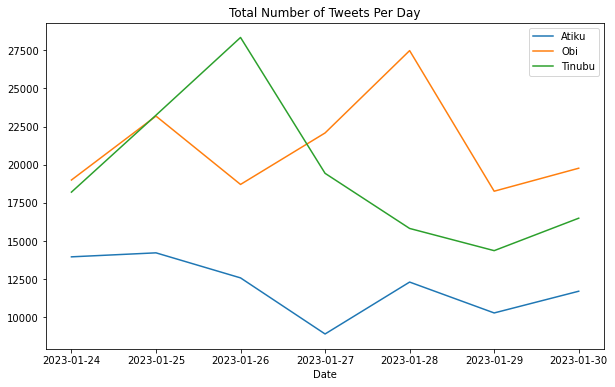

In [26]:
daily_tw.plot(kind='line', figsize=(10,6), title='Total Number of Tweets Per Day')

In [27]:
#Next, We look at the average number of likes each candidate gets daily.
def get_average_likes(dfg):
    Likes = dfg['Likes']
    return Likes.mean()

In [28]:
avg_likes = pd.concat([get_average_likes(atiku_grouped),get_average_likes(obi_grouped),get_average_likes(tinubu_grouped)],axis=1)
avg_likes.columns=['Atiku','Obi','Tinubu']

In [29]:
avg_likes

,Atiku,Obi,Tinubu
Date,,,
2023-01-24,9.682590,23.058904,10.602978
2023-01-25,7.869174,26.892862,19.649716
2023-01-26,8.916243,26.944085,15.409394
2023-01-27,11.310585,28.576468,12.563674
2023-01-28,10.935337,30.921165,15.511281
2023-01-29,9.502576,16.646827,13.373234
2023-01-30,10.107942,25.089125,11.238921


<AxesSubplot:title={'center':'Average number of likes per tweet'}, xlabel='Date'>

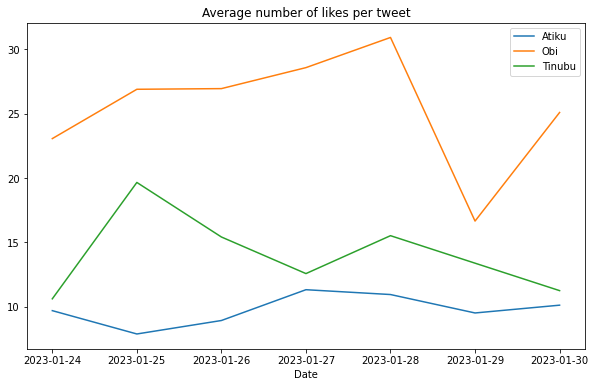

In [30]:
avg_likes.plot(kind='line', figsize=(10,6), title='Average number of likes per tweet')

##### Generating Wordclouds

In [72]:
#Next,I will generate wordclouds for each of the dataframes. This will give us a clear representation of what words and hashtags are most associated with each candidate.

In [32]:
#First, I'll import the necessary libraries
import regex
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [33]:
atiku_df['Tweet']

0        @YeleSowore @atiku @OfficialPDPNig @officialAB...
1        @BwalaDaniel Atiku, Senate president! This man...
2        @SegunAsala @YeleSowore @atiku @OfficialPDPNig...
3        DJ play me as e dey sweet us e go dey pain dem...
4         @Qdpaper2 He said he made atiku senate president
                               ...                        
83983               @AhmedAdamu @atiku I will vote for him
83984    @atiku My people for Niger-Delta go collect yo...
83985                             @atiku My Allah help you
83986    @atiku Greedy Atiku, don't waste stolen resour...
83987    @IAOkowa @atiku We welcome PDP Presidential Ca...
Name: Tweet, Length: 83988, dtype: object

In [34]:
atiku_chatter = ' '.join(words for words in atiku_df.Tweet)

In [35]:
atiku_chatter

'@YeleSowore @atiku @OfficialPDPNig @officialABAT @OfficialAPCNg @PeterObi @NgLabour And you? @BwalaDaniel Atiku, Senate president! This man is confusing Atiku and Saraki. Wahala dey o! Shebi we talk say, "Nigerians don enter one chance" when Buhari was elected, with Mr Tinubu, na "three chance" we go enter. @SegunAsala @YeleSowore @atiku @OfficialPDPNig @officialABAT @OfficialAPCNg @PeterObi @NgLabour Shebi na the beg we dey beg am so? We dey beg to stay away from envying Peter Obi and focus on his campaign. DJ play me as e dey sweet us e go dey pain dem, as e dey pain dem e go dey sweet us😂😂😂💙\n\nIn 2019 the easterners supported atiku, as for 2023, forget it!\n\nIt\'s a year different from balablu bula ba😂😂😂\n\n#JoyIsComing\n#NigeriaDecides2023 https://t.co/e8n9N4UnB9 @Qdpaper2 He said he made atiku senate president @Esteembehemoth That guy na closet agbado, he defends balablu more than he defends Atiku Naka Yanzu Sai Naka, yan Arewa ga naku Atiku shifa zamu zaba Dai.🙏♥️💯 Nobody is t

In [36]:
obi_chatter= ' '.join(words for words in obi_df.Tweet)

In [37]:
tinubu_chatter=' '.join(words for words in tinubu_df.Tweet)

In [38]:
#Before generating wordclouds, first we'll retrieve the top hashtags used in each candidates' tweet mentions. 
#Then we'll retrieve the accounts their tweet mentions usually tags.

In [39]:
#Our extract_hashtags returns the top hashtags used for each candidates' mentions.
def extract_top_hashtags(text):
    hashtags_list = []
    for word in text.split():
        if word[0]=='#':
            hashtags_list.append(word)
            
    hashtags_list = Counter(hashtags_list)
    hashtags_df = pd.DataFrame.from_dict(hashtags_list, orient='index',columns=['Number of Times used']).sort_values(by='Number of Times used',ascending=False)
    return hashtags_df

In [40]:
atiku_hashtags = extract_top_hashtags(atiku_chatter)
atiku_hashtags.head(12)

,Number of Times used
#RecoverNigeria,1203
#TeamAtiku,825
#AtikuOkowa2023,588
#AtikuInDelta,419
#PDPMegaRallyInDelta,318
#Atiku,310
#AtikuForAll,282
#OkowaIsWorking,229
#ObidientMovement,222
#VotePDP,210


(-0.5, 399.5, 199.5, -0.5)

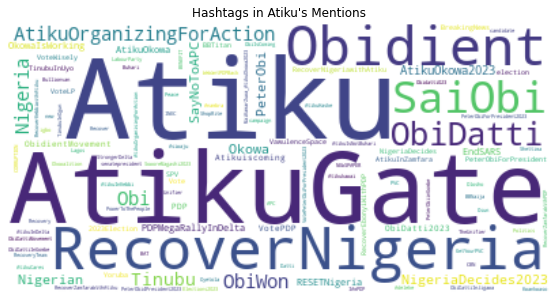

In [54]:
wordcloud = WordCloud(background_color="white").generate(''.join(tags for tags in atiku_hashtags.index))
wordcloud
plt.figure(figsize=(10,5),)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Hashtags in Atiku's Mentions")
plt.axis('off')

In [41]:
obi_hashtags = extract_top_hashtags(obi_chatter)
obi_hashtags.head(12)

,Number of Times used
#ObidientMovement,1344
#PeterObi4President2023,1288
#SaiObi,1285
#PeterObi,1130
#PeterObiForPresident2023,870
#ObiDatti2023,663
#ObiDattiInBorno,603
#ObiDattiInGombe,595
#ObiDattiInBauchi,470
#VoteLP,455


(-0.5, 399.5, 199.5, -0.5)

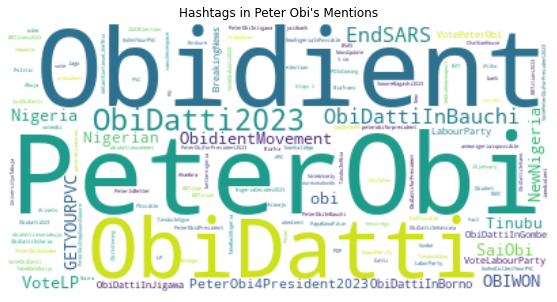

In [75]:
wordcloud = WordCloud(background_color="white").generate(''.join(tags for tags in obi_hashtags.index))
wordcloud
plt.figure(figsize=(10,5),)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Hashtags in Peter Obi's Mentions")
plt.axis('off')

In [42]:
tinubu_hashtags = extract_top_hashtags(tinubu_chatter)
tinubu_hashtags.head(12)

,Number of Times used
#GodswillAkapabio,1679
#Tinubu,974
#ObidientMovement,688
#SaiObi,602
#TinubuInOgun,439
#ObiDattiInGombe,338
#Nigeria,316
#OBIWON,315
#TinubuIsComing,306
#RenewedHope2023,300


(-0.5, 399.5, 199.5, -0.5)

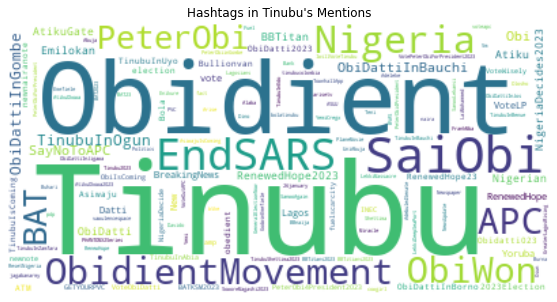

In [55]:
wordcloud = WordCloud(background_color="white").generate(''.join(tags for tags in tinubu_hashtags.index))
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Hashtags in Tinubu's Mentions")
plt.axis('off')

In [43]:
#NOw, I'll extract the top accounts tagged in each candidate's tweet mentions.
def extract_tagged_accounts(text):
    tagged_accounts = []
    for word in text.split():
        if word[0]=='@':
            tagged_accounts.append(word)
            
    tagged_accounts = Counter(tagged_accounts)
    tagged_df = pd.DataFrame.from_dict(tagged_accounts, orient='index',columns=['Number of Times tagged']).sort_values(by='Number of Times tagged',ascending=False)
    return tagged_df

In [44]:
atiku_tagged = extract_tagged_accounts(atiku_chatter)
atiku_tagged.head(12)

,Number of Times tagged
@atiku,30419
@PeterObi,6961
@_Khadejah_atiku,6733
@officialABAT,5813
@OfficialPDPNig,4307
@IAOkowa,3614
@AWaziri7,2437
@gchahal,2184
@emmaikumeh,1990
@U_Rochas,1765


In [45]:
obi_tagged = extract_tagged_accounts(obi_chatter)
obi_tagged.head(12)

,Number of Times tagged
@PeterObi,93202
@NgLabour,9207
@AishaYesufu,6935
@atiku,6727
@officialABAT,6527
@firstladyship,4462
@Jack_ng01,3912
@solakafinta,3723
@OselokaHObaze,3445
@JackObinyan,3229


In [46]:
tinubu_tagged = extract_tagged_accounts(tinubu_chatter)
tinubu_tagged.head(12)

,Number of Times tagged
@officialABAT,38871
@fkeyamo,8650
@PeterObi,8165
@atiku,5995
@OfficialAPCNg,3961
@adamugarba,3254
@MBuhari,3098
@KashimSM,2827
@gchahal,2240
@SavvyRinu,1876


In [142]:
#To get hyperlinks,I'm sure there is an intricate regex expression to get hyperlinks, I'll keep it simple by just extracting all strings that contain 'https'. 
def get_hyperlinks(chatter):
    hyperlinks = []
    for word in chatter.split():
        if 'https' in word:
            hyperlinks.append(word)
    return hyperlinks

##### 2. A look at 'Ratios'.

In [77]:
#First we look at the level of 'ratios' tweets mentioning each candidate get.
#To get a clearer picture, we'll only include tweets with more than 50 likes.

In [90]:
atiku_grp = atiku_df[atiku_df['Likes']>50].groupby('Date')
obi_grp = obi_df[obi_df['Likes']>50].groupby('Date')
tinubu_grp = tinubu_df[tinubu_df['Likes']>50].groupby('Date')

In [91]:
def get_average_ratios(dfg):
    Ratios = dfg['Ratio']
    return Ratios.mean()

In [95]:
avg_ratios = pd.concat([get_average_ratios(atiku_grp),get_average_ratios(obi_grp),get_average_ratios(tinubu_grp)],axis=1)
avg_ratios.columns=['Atiku','Obi','Tinubu']

In [96]:
avg_ratios

,Atiku,Obi,Tinubu
Date,,,
2023-01-24,0.156790,0.082639,0.117930
2023-01-25,0.144823,0.066869,0.112379
2023-01-26,0.123590,0.056048,0.109676
2023-01-27,0.132599,0.058909,0.112118
2023-01-28,0.104370,0.046050,0.099938
2023-01-29,0.121379,0.077125,0.119229
2023-01-30,0.123327,0.062207,0.121786


<AxesSubplot:title={'center':'Average Ratio Per Mention'}, xlabel='Date'>

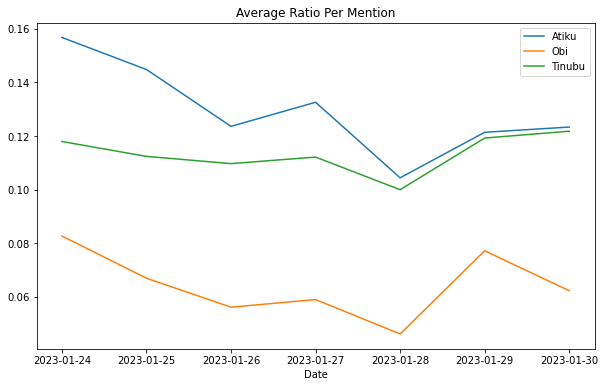

In [102]:
avg_ratios.plot(kind='line', figsize=(10,6), title='Average Ratio Per Mention')

In [103]:
#I'll narrow my focus to glean more information.
#Per our definition, a tweet is ratioed if its Ratio value is greater than 1. 
#So now, we'll look at tweets with 100 or more likes and ratio value greater than 1.

In [104]:
atiku_ratioed = atiku_df[(atiku_df['Likes']>=100)&(atiku_df['Ratio']>1)]
atiku_ratioed

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
883,2023-01-30,22:18,‘The only thing I can tell you is that issue o...,1435,1365,117,1.032753
1931,2023-01-30,20:57,1. @Atiku Abubakar Atiku of @OfficialPDPNig h...,719,960,87,1.456189
4679,2023-01-30,17:12,Our Recover Nigeria rally in Gusau this aftern...,1508,2323,12,1.548408
9403,2023-01-30,08:41,"Elders like Edwin Clark, Obasanjo, etc support...",2676,3182,245,1.280643
15063,2023-01-29,16:15,It is commendable that the CBN finally listene...,2463,3066,53,1.266342
15717,2023-01-29,14:53,Who are you voting for? Please type BOLDLY!! D...,279,282,23,1.093190
18491,2023-01-29,10:18,But you couldn’t create new Anambra sir neithe...,176,252,22,1.556818
29060,2023-01-28,12:44,Tein Jack-Rich is a vibrant businessman and a ...,1125,1673,10,1.496000
31407,2023-01-28,09:50,My position on the CBN January 31st deadline o...,2920,3048,181,1.105822
32368,2023-01-28,08:23,"I will say it over and over again, Peter Grego...",362,436,28,1.281768


In [106]:
tinubu_ratioed = tinubu_df[(tinubu_df['Likes']>=100)&(tinubu_df['Ratio']>1)]
tinubu_ratioed

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
836,2023-01-30,22:47,"When Obidients talk about Obi’s competency, ca...",616,681,39,1.168831
2811,2023-01-30,20:57,1. @Atiku Abubakar Atiku of @OfficialPDPNig h...,734,977,88,1.450954
12298,2023-01-30,09:26,"There is a prophecy that says ""Nigeria can nev...",613,574,50,1.017945
13035,2023-01-30,08:41,"Elders like Edwin Clark, Obasanjo, etc support...",2685,3192,245,1.280074
26098,2023-01-29,10:18,But you couldn’t create new Anambra sir neithe...,176,252,22,1.556818
40017,2023-01-28,12:36,Labour Party must join PDP to remove APC! Tinu...,194,132,65,1.015464
53362,2023-01-27,14:15,Tinubu did not indict Buhari's administration ...,158,163,30,1.221519
55616,2023-01-27,11:50,"The President, CBN Governor and Asiwaju are on...",392,428,23,1.150510
62379,2023-01-27,07:12,I’ll be supporting Tinubu for President becaus...,744,376,394,1.034946
72884,2023-01-26,17:55,"Our Presidential Candidate, Asiwaju Bola Ahmed...",3610,3103,1070,1.155956


In [107]:
obi_ratioed = obi_df[(obi_df['Likes']>=100)&(obi_df['Ratio']>1)]
obi_ratioed

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
1158,2023-01-30,22:18,‘The only thing I can tell you is that issue o...,1444,1371,117,1.030471
2448,2023-01-30,20:57,1. @Atiku Abubakar Atiku of @OfficialPDPNig h...,723,966,87,1.456432
18643,2023-01-30,05:56,@MoghaluKingsley @PeterObi And you have nailed...,138,281,31,2.260870
20391,2023-01-29,22:23,"Obidients are zombies 🧟‍♀️, they are brainless...",301,370,24,1.308970
35095,2023-01-29,06:55,Former Governor Peter Obi pictured sharing mon...,170,168,17,1.088235
60979,2023-01-28,08:23,"I will say it over and over again, Peter Grego...",362,436,28,1.281768
61455,2023-01-28,08:05,"I swear to God, I will be the highest opposer ...",560,941,86,1.833929
83031,2023-01-27,08:18,Nigerians will never vote for any member of IP...,244,282,20,1.237705
84749,2023-01-27,07:03,"Peter Obi’s media team: left to right: Chuma, ...",1744,1733,196,1.106078
88258,2023-01-26,22:33,Nigeria doesn’t need a good man as President –...,202,209,185,1.950495


In [108]:
#I'll concatenate these three ratio dataframes. Later, I'll do a sentimental analysis of the resulting dataframe.
#For now, I'll look out the hashtags associated with the ratioed tweets and then generate a wordcloud.

In [119]:
the_ratioed = pd.concat([atiku_ratioed,obi_ratioed,tinubu_ratioed],axis=0)

In [121]:
the_ratioed.reset_index(drop=True,inplace=True)

In [122]:
the_ratioed

,Date,Time,Tweet,Likes,Replies,Quotes,Ratio
0,2023-01-30,22:18,‘The only thing I can tell you is that issue o...,1435,1365,117,1.032753
1,2023-01-30,20:57,1. @Atiku Abubakar Atiku of @OfficialPDPNig h...,719,960,87,1.456189
2,2023-01-30,17:12,Our Recover Nigeria rally in Gusau this aftern...,1508,2323,12,1.548408
3,2023-01-30,08:41,"Elders like Edwin Clark, Obasanjo, etc support...",2676,3182,245,1.280643
4,2023-01-29,16:15,It is commendable that the CBN finally listene...,2463,3066,53,1.266342
...,...,...,...,...,...,...,...
64,2023-01-25,13:25,Poll #2:\n\nWho is the next President of #Nige...,663,2147,9,3.251885
65,2023-01-25,10:59,"Vote For My Father, Tinubu Because I Married A...",1900,1712,467,1.146842
66,2023-01-25,05:00,"*💥In year 2000, i wanted to start Kanu Heart F...",899,1,1465,1.630701
67,2023-01-24,19:47,@officialABAT U deserve d whole votes of South...,109,103,10,1.036697


In [131]:
ratio_chatter= ' '.join(words for words in the_ratioed.Tweet)

In [123]:
ratio_hashtags=extract_top_hashtags(' '.join(words for words in the_ratioed.Tweet))

(-0.5, 399.5, 199.5, -0.5)

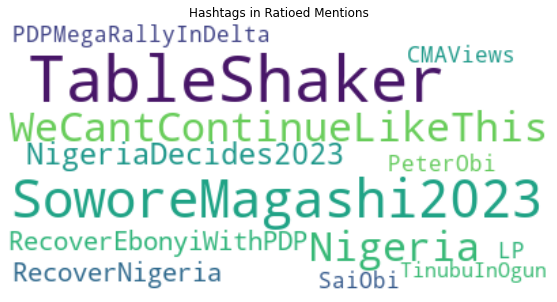

In [57]:
wordcloud = WordCloud(background_color='white').generate(''.join(tags for tags in ratio_hashtags.index))
wordcloud
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Hashtags in Ratioed Mentions")
plt.axis('off')

In [129]:
#Now to generae a wordcloud from the raw Tweets
#First, we compile stopwords - The default stopwords, hashtags, tagged accounts and hyperlinks.

In [132]:
ratio_tags = extract_tagged_accounts(ratio_chatter)
ratio_tags

,Number of Times tagged
@officialABAT,7
@atiku,5
@PeterObi,5
@Atiku,3
@OfficialPDPNig,3
@OfficialAPCNg,3
@peterObi,3
@NgLabour,3
@AjuriNgelale,2
@YarKafanchan.,2


In [144]:
ratio_links=get_hyperlinks(ratio_chatter)

In [165]:
stop_words= list(STOPWORDS)+list(ratio_hashtags.index)+list(ratio_tags.index)+ratio_links

(-0.5, 399.5, 199.5, -0.5)

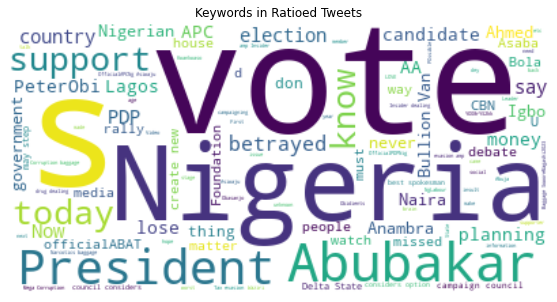

In [58]:
wordcloud = WordCloud(stopwords=stop_words, background_color='white').generate(ratio_chatter)
wordcloud
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Keywords in Ratioed Tweets")
plt.axis('off')

##### 3. Sentiment Analysis

In [191]:
#First, I'll clean the tweets in each of the dataframes and compile them into a list.
#By cleaning I mean removing links, hashtags and special characters.
import re

In [205]:
def get_clean_tweets(df):
    tweets = list(df['Tweet'])
    cleaned = []
    
    for tweet in tweets:
        r = tweet.lower()
        r = re.sub("@[A-Za-z0-9_]+","", r)  
        r = re.sub("#[A-Za-z0-9_]+","", r)  
        r = re.sub(r'http\S+', '', r) 
        r = re.sub('\[.*?\]',' ', r) 
        r = re.sub("[^a-z0-9]"," ", r)
        r = re.sub('[()!?]', ' ', r)
        cleaned.append(r)

    return cleaned

In [215]:
#I'll be using the TextBlob Sentiment Analyzer so Imma go ahead and import it.
#pip install textblob
from textblob import TextBlob

In [229]:
atiku_cleaned = get_clean_tweets(atiku_df)
obi_cleaned = get_clean_tweets(obi_df)
tinubu_cleaned = get_clean_tweets(tinubu_df)

In [223]:
def get_sentiments(tweets):
    sentiment_obj =[TextBlob(tweet) for tweet in tweets]
    sentiment_values = [[tweet.sentiment.polarity, str(tweet)] for tweet in sentiment_obj]
    
    sentiment_df =  pd.DataFrame(sentiment_values, columns=["Polarity", "Tweet"])
    return sentiment_df

In [224]:
atiku_sentiments=get_sentiments(atiku_cleaned)
atiku_sentiments

,Polarity,Tweet
0,0.000000,and you
1,-0.300000,atiku senate president this man is confusin...
2,0.000000,shebi na the beg we dey beg am so we ...
3,0.233333,dj play me as e dey sweet us e go dey pain dem...
4,0.000000,he said he made atiku senate president
...,...,...
83983,0.000000,i will vote for him
83984,0.366667,my people for niger delta go collect your mon...
83985,0.000000,my allah help you
83986,-0.250000,greedy atiku don t waste stolen resources on...


#### The Polarity variable lies within the range [-1:1] where a negative value represents a negative sentiment and a positive value represent a positive sentiment. A polarity value of 0 represents neutrality.

In [225]:
obi_sentiments = get_sentiments(obi_cleaned)
obi_sentiments

,Polarity,Tweet
0,0.000000,and you
1,0.000000,shebi na the beg we dey beg am so we ...
2,0.129167,hey mr thank you for all you ve done in rece...
3,-0.200000,tinubu ur presidential candidate is campaign...
4,-0.140000,we can actually win this election without prop...
...,...,...
148473,0.183333,chai make obi win make i go ride camel for k...
148474,-0.176984,e don reach make we dey gbe won sepe abi any ...
148475,0.085714,its politics he can not start saying publi...
148476,0.043750,watch what a san supposed legal professional ...


In [230]:
tinubu_sentiments = get_sentiments(tinubu_cleaned)
tinubu_sentiments

,Polarity,Tweet
0,0.00,and you
1,-0.30,atiku senate president this man is confusin...
2,0.00,how market nau abi una still want to dey pla...
3,0.00,shebi na the beg we dey beg am so we ...
4,-0.20,tinubu ur presidential candidate is campaign...
...,...,...
135901,0.00,i don t think you should defend using g...
135902,0.00,this man talks with gusto and panache
135903,0.00,vote your candidate but don t say obi is an...
135904,0.35,chris is it true that wike have declare suppo...


In [234]:
#Now, I'll add a new column called Sentiment, where I'll classify each tweet's polarity into either Positive, Negative or Neutral

def classify_polarity(x):
    if x>0:
        return 'Positive'
    elif x<0:
        return 'Negative'
    else:
        return 'Neutral'

In [235]:
atiku_sentiments['Sentiment']=atiku_sentiments['Polarity'].apply(lambda x:classify_polarity(x))

In [236]:
atiku_sentiments

,Polarity,Tweet,Sentiment
0,0.000000,and you,Neutral
1,-0.300000,atiku senate president this man is confusin...,Negative
2,0.000000,shebi na the beg we dey beg am so we ...,Neutral
3,0.233333,dj play me as e dey sweet us e go dey pain dem...,Positive
4,0.000000,he said he made atiku senate president,Neutral
...,...,...,...
83983,0.000000,i will vote for him,Neutral
83984,0.366667,my people for niger delta go collect your mon...,Positive
83985,0.000000,my allah help you,Neutral
83986,-0.250000,greedy atiku don t waste stolen resources on...,Negative


In [237]:
obi_sentiments['Sentiment']=obi_sentiments['Polarity'].apply(lambda x:classify_polarity(x))
obi_sentiments

,Polarity,Tweet,Sentiment
0,0.000000,and you,Neutral
1,0.000000,shebi na the beg we dey beg am so we ...,Neutral
2,0.129167,hey mr thank you for all you ve done in rece...,Positive
3,-0.200000,tinubu ur presidential candidate is campaign...,Negative
4,-0.140000,we can actually win this election without prop...,Negative
...,...,...,...
148473,0.183333,chai make obi win make i go ride camel for k...,Positive
148474,-0.176984,e don reach make we dey gbe won sepe abi any ...,Negative
148475,0.085714,its politics he can not start saying publi...,Positive
148476,0.043750,watch what a san supposed legal professional ...,Positive


In [238]:
tinubu_sentiments['Sentiment']=tinubu_sentiments['Polarity'].apply(lambda x:classify_polarity(x))
tinubu_sentiments

,Polarity,Tweet,Sentiment
0,0.00,and you,Neutral
1,-0.30,atiku senate president this man is confusin...,Negative
2,0.00,how market nau abi una still want to dey pla...,Neutral
3,0.00,shebi na the beg we dey beg am so we ...,Neutral
4,-0.20,tinubu ur presidential candidate is campaign...,Negative
...,...,...,...
135901,0.00,i don t think you should defend using g...,Neutral
135902,0.00,this man talks with gusto and panache,Neutral
135903,0.00,vote your candidate but don t say obi is an...,Neutral
135904,0.35,chris is it true that wike have declare suppo...,Positive


In [239]:
obi_sentiments['Sentiment'].value_counts()

Neutral     69011
Positive    57709
Negative    21758
Name: Sentiment, dtype: int64

In [240]:
tinubu_sentiments['Sentiment'].value_counts()

Neutral     60020
Positive    48943
Negative    26943
Name: Sentiment, dtype: int64

In [5]:
atiku_sentiments['Sentiment'].value_counts()

Neutral     41835
Positive    28987
Negative    13166
Name: Sentiment, dtype: int64

In [35]:
def plot_pie_chart(values, title):
    
    pieLabels=["Neutral","Positive","Negative"]

    populationShare=values

    figureObject, axesObject = plt.subplots()

    axesObject.pie(populationShare,labels=pieLabels,autopct='%1.2f',startangle=90)

    axesObject.axis('equal')
    
    plt.title(title)

    return plt.show()

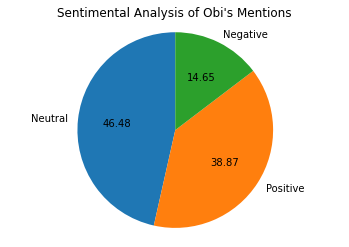

In [36]:
plot_pie_chart(list(obi_sentiments['Sentiment'].value_counts()), "Sentimental Analysis of Obi's Mentions")

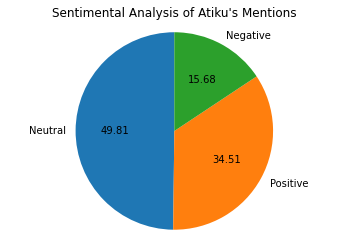

In [38]:
plot_pie_chart(list(atiku_sentiments['Sentiment'].value_counts()), "Sentimental Analysis of Atiku's Mentions")

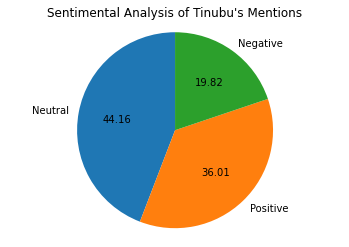

In [39]:
plot_pie_chart(list(tinubu_sentiments['Sentiment'].value_counts()), "Sentimental Analysis of Tinubu's Mentions")

##### Sentimental Analysis of the Ratioed Tweets

In [40]:
cleaned_ratios = get_clean_tweets(the_ratioed)

In [42]:
ratioed_sentiments = get_sentiments(cleaned_ratios)

In [45]:
ratioed_sentiments

,Polarity,Tweet
0,-0.277778,the only thing i can tell you is that issue o...
1,0.000000,1 abubakar atiku of has mega corruption ba...
2,0.800000,our recover nigeria rally in gusau this aftern...
3,0.000000,elders like edwin clark obasanjo etc support...
4,-0.013333,it is commendable that the cbn finally listene...
...,...,...
64,0.000000,poll who is the next president of in 31 da...
65,0.250000,vote for my father tinubu because i married a...
66,0.000000,in year 2000 i wanted to start kanu heart f...
67,0.390000,u deserve d whole votes of south east cos you...


In [46]:
ratioed_sentiments['Sentiment']=ratioed_sentiments['Polarity'].apply(lambda x:classify_polarity(x))

In [47]:
ratioed_sentiments

,Polarity,Tweet,Sentiment
0,-0.277778,the only thing i can tell you is that issue o...,Negative
1,0.000000,1 abubakar atiku of has mega corruption ba...,Neutral
2,0.800000,our recover nigeria rally in gusau this aftern...,Positive
3,0.000000,elders like edwin clark obasanjo etc support...,Neutral
4,-0.013333,it is commendable that the cbn finally listene...,Negative
...,...,...,...
64,0.000000,poll who is the next president of in 31 da...,Neutral
65,0.250000,vote for my father tinubu because i married a...,Positive
66,0.000000,in year 2000 i wanted to start kanu heart f...,Neutral
67,0.390000,u deserve d whole votes of south east cos you...,Positive


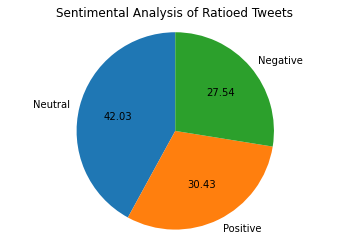

In [48]:
plot_pie_chart(list(ratioed_sentiments['Sentiment'].value_counts()), "Sentimental Analysis of Ratioed Tweets")

##### The End.

In [49]:
#dill.dump_session('notebook_env.db')